<a href="https://colab.research.google.com/github/yzihan/Generative-AI/blob/main/generative%20method%20for%20creative%20applications-MAS.s66/MSE_Regularized_VQGAN%2BClip_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MSE Regularized VQGAN + Clip (v.2)
by [@jbusted1](https://twitter.com/jbusted1)

Generates images from text prompts with VQGAN and CLIP (z+quantize method), with MSE regularization.

#### 🎁 Improvements
- Added custom schedule of learning rates and mse weights to get more cohesive results
- Adjusted augmentation pipeline for better stability
- Add CLIP Prior technique to convert text prompts to image prompts for greater variety (highley recommended) 
- Included several presets to help test out the technique, depending on your goals

---

*Based on a notebook by Katherine Crowson ([@RiversHaveWings](https://twitter.com/RiversHaveWings) who also trained the Clip prior, https://github.com/crowsonkb); with some UX help from [@remi_durant](https://twitter.com/remi_durant).*

![visitors](https://visitor-badge.glitch.me/badge?page_id=jbusterr_vqganclipmse2022)

In [2]:
#@markdown Licensed under the MIT License

# Copyright (c) 2022 Katherine Crowson and John David Pressman

# Permission is hereby granted, free of charge, to any person obtaining a copy
# of this software and associated documentation files (the "Software"), to deal
# in the Software without restriction, including without limitation the rights
# to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
# copies of the Software, and to permit persons to whom the Software is
# furnished to do so, subject to the following conditions:

# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.

# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
# AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN
# THE SOFTWARE.

In [1]:
#@title First check what GPU you got and make sure it's a good one. 
#@markdown - Tier List: (K80 < T4 < P100 < V100 < A100)
from subprocess import getoutput
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader

Tesla T4, 15109 MiB, 15109 MiB


# Setup (Run Once)

## Download and install dependencies ⏬

In [3]:
# @markdown installations
!git clone https://github.com/openai/CLIP
!git clone https://github.com/CompVis/taming-transformers
!pip install ftfy regex tqdm omegaconf pytorch-lightning
# !git clone https://github.com/nousr/DALLE2-pytorch.git; cd DALLE2-pytorch; git checkout checkpoints; pip install .; cd ..
# !git clone https://github.com/nousr/DALLE2-pytorch.git==0.15.4; cd DALLE2-pytorch; git checkout checkpoints; pip install .; cd ..
# !pip install dalle2-pytorch==0.6.16
!git clone https://github.com/crowsonkb/v-diffusion-pytorch.git


#0.15.4
!pip install kornia
!pip install einops
!pip3 install pytorch-optimizer

Cloning into 'CLIP'...
remote: Enumerating objects: 236, done.
remote: Total 236 (delta 0), reused 0 (delta 0), pack-reused 236
Receiving objects: 100% (236/236), 8.92 MiB | 25.16 MiB/s, done.
Resolving deltas: 100% (120/120), done.
Cloning into 'taming-transformers'...
remote: Enumerating objects: 1335, done.
remote: Total 1335 (delta 0), reused 0 (delta 0), pack-reused 1335
Receiving objects: 100% (1335/1335), 409.77 MiB | 50.13 MiB/s, done.
Resolving deltas: 100% (279/279), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53 kB 1.5 MB/s 
     |████████████████████████████████| 79 kB 4.5 MB/s 
     |████████████████████████████████| 708 kB 44.6 MB/s 
     |████████████████████████████████| 117 kB 71.3 MB/s 
     |████████████████████████████████| 529 kB 50.7 MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144575 sha256=52beaa0ca

Cloning into 'v-diffusion-pytorch'...
remote: Enumerating objects: 155, done.
remote: Counting objects: 100% (100/100), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 155 (delta 82), reused 66 (delta 59), pack-reused 55
Receiving objects: 100% (155/155), 32.43 KiB | 1.80 MiB/s, done.
Resolving deltas: 100% (98/98), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 551 kB 5.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 56 kB 2.7 MB/s 


In [4]:
# @markdown model downloads
!curl -L https://models.rivershavewings.workers.dev/clip_prior_6_6370000.pth > clip_prior_6_6370000.pth
!curl -L 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1' > vqgan_imagenet_f16_16384.yaml
!curl -L 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1' > vqgan_imagenet_f16_16384.ckpt

# !wget 'https://huggingface.co/zenglishuci/conditioned-prior/resolve/main/vit-b-32/ema641.pth' -O prior_B.pth

# !curl -L https://dl.nmkd.de/ai/clip/vqgan/8k-2021-06/vqgan-f8-8192.ckpt > vqgan_openimages_f16_8192.ckpt
# !curl -L https://dl.nmkd.de/ai/clip/vqgan/8k-2021-06/vqgan-f8-8192.yaml > vqgan_openimages_f16_8192.yaml
# http://batbot.tv/misc/coco_first_stage.yaml
# http://batbot.tv/misc/coco_first_stage.ckpt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  331M  100  331M    0     0  37.6M      0  0:00:08  0:00:08 --:--:-- 40.9M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100   692  100   692    0     0    909      0 --:--:-- --:--:-- --:--:--   909
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  934M  100  934M    0     0  14.8M      0  0:01:02  0:01:02 --:--:-- 15.9M


## Utilities 🚁

In [5]:
# @markdown update path
import sys
sys.path.append('./taming-transformers')
sys.path.append('./v-diffusion-pytorch')

In [6]:
# @markdown imports

from taming.modules.diffusionmodules.model import Decoder
sys.path.append('./v-diffusion-pytorch')

import argparse
import math
from pathlib import Path
import sys

sys.path.append('./taming-transformers')

from IPython import display
from omegaconf import OmegaConf
from PIL import Image
from taming.models import cond_transformer, vqgan
import torch
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm
import numpy as np

from CLIP import clip

from torch.optim import Optimizer
import kornia.augmentation as K
import kornia

from kornia.augmentation.container import AugmentationSequential

# from dalle2_pytorch import DiffusionPrior, DiffusionPriorNetwork,OpenAIClipAdapter, DiffusionPriorTrainer
from diffusion import sampling, utils as diff_utils

In [7]:
# @markdown vqgan related

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.optimizer import Optimizer, required
from torch.optim import SGD
from torch.optim.lr_scheduler import StepLR
import math

class SGDP(Optimizer):
    def __init__(self, params, lr=required, momentum=0, dampening=0,
                 weight_decay=0, nesterov=False, eps=1e-8, delta=0.1, wd_ratio=0.1):
        defaults = dict(lr=lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay,
                        nesterov=nesterov, eps=eps, delta=delta, wd_ratio=wd_ratio)
        super(SGDP, self).__init__(params, defaults)

    def _channel_view(self, x):
        return x.reshape(x.size(0), -1)

    def _layer_view(self, x):
        return x.reshape(1, -1)

    def _cosine_similarity(self, x, y, eps, view_func):
        x = view_func(x)
        y = view_func(y)

        return F.cosine_similarity(x, y, dim=1, eps=eps).abs_()

    def _projection(self, p, grad, perturb, delta, wd_ratio, eps):
        wd = 1
        expand_size = [-1] + [1] * (len(p.shape) - 1)
        for view_func in [self._channel_view, self._layer_view]:

            cosine_sim = self._cosine_similarity(grad, p.data, eps, view_func)

            if cosine_sim.max() < delta / math.sqrt(view_func(p.data).size(1)):
                p_n = p.data / view_func(p.data).norm(dim=1).view(expand_size).add_(eps)
                perturb -= p_n * view_func(p_n * perturb).sum(dim=1).view(expand_size)
                wd = wd_ratio

                return perturb, wd

        return perturb, wd

    def step(self, closure=None):
        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:
            momentum = group['momentum']
            dampening = group['dampening']
            nesterov = group['nesterov']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad.data
                state = self.state[p]

                # State initialization
                if len(state) == 0:
                    state['momentum'] = torch.zeros_like(p.data)

                # SGD
                buf = state['momentum']
                buf.mul_(momentum).add_(grad, alpha=1 - dampening)
                if nesterov:
                    d_p = grad + momentum * buf
                else:
                    d_p = buf

                # Projection
                wd_ratio = 1
                if len(p.shape) > 1:
                    d_p, wd_ratio = self._projection(p, grad, d_p, group['delta'], group['wd_ratio'], group['eps'])

                # Weight decay
                if group['weight_decay'] > 0:
                    p.data.mul_(1 - group['lr'] * group['weight_decay'] * wd_ratio / (1-momentum))

                # Step
                p.data.add_(d_p, alpha=-group['lr'])

        return 

class adamp(Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8,
                 weight_decay=0, delta=0.1, wd_ratio=0.1, nesterov=False):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay,
                        delta=delta, wd_ratio=wd_ratio, nesterov=nesterov)
        super(adamp, self).__init__(params, defaults)

    def _channel_view(self, x):
        return x.reshape(x.size(0), -1)

    def _layer_view(self, x):
        return x.reshape(1, -1)

    def _cosine_similarity(self, x, y, eps, view_func):
        x = view_func(x)
        y = view_func(y)

        return F.cosine_similarity(x, y, dim=1, eps=eps).abs_()

    def _projection(self, p, grad, perturb, delta, wd_ratio, eps):
        wd = 1
        expand_size = [-1] + [1] * (len(p.shape) - 1)
        for view_func in [self._channel_view, self._layer_view]:

            cosine_sim = self._cosine_similarity(grad, p.data, eps, view_func)

            if cosine_sim.max() < delta / math.sqrt(view_func(p.data).size(1)):
                p_n = p.data / view_func(p.data).norm(dim=1).view(expand_size).add_(eps)
                perturb -= p_n * view_func(p_n * perturb).sum(dim=1).view(expand_size)
                wd = wd_ratio

                return perturb, wd

        return perturb, wd

    def step(self, closure=None):
        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None:
                    continue

                grad = p.grad.data
                beta1, beta2 = group['betas']
                nesterov = group['nesterov']

                state = self.state[p]

                # State initialization
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p.data)
                    state['exp_avg_sq'] = torch.zeros_like(p.data)

                # Adam
                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']

                state['step'] += 1
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                denom = (exp_avg_sq.sqrt() / math.sqrt(bias_correction2)).add_(group['eps'])
                step_size = group['lr'] / bias_correction1

                if nesterov:
                    perturb = (beta1 * exp_avg + (1 - beta1) * grad) / denom
                else:
                    perturb = exp_avg / denom

                # Projection
                wd_ratio = 1
                if len(p.shape) > 1:
                    perturb, wd_ratio = self._projection(p, grad, perturb, group['delta'], group['wd_ratio'], group['eps'])

                # Weight decay
                if group['weight_decay'] > 0:
                    p.data.mul_(1 - group['lr'] * group['weight_decay'] * wd_ratio)

                # Step
                p.data.add_(perturb, alpha=-step_size)

        return loss


def noise_gen(shape):
    n, c, h, w = shape
    noise = torch.zeros([n, c, 1, 1])
    for i in reversed(range(5)):
        h_cur, w_cur = h // 2**i, w // 2**i
        noise = F.interpolate(noise, (h_cur, w_cur), mode='bicubic', align_corners=False)
        noise += torch.randn([n, c, h_cur, w_cur]) / 5
    return noise


def sinc(x):
    return torch.where(x != 0, torch.sin(math.pi * x) / (math.pi * x), x.new_ones([]))


def lanczos(x, a):
    cond = torch.logical_and(-a < x, x < a)
    out = torch.where(cond, sinc(x) * sinc(x/a), x.new_zeros([]))
    return out / out.sum()


def ramp(ratio, width):
    n = math.ceil(width / ratio + 1)
    out = torch.empty([n])
    cur = 0
    for i in range(out.shape[0]):
        out[i] = cur
        cur += ratio
    return torch.cat([-out[1:].flip([0]), out])[1:-1]


def resample(input, size, align_corners=True):
    n, c, h, w = input.shape
    dh, dw = size

    input = input.view([n * c, 1, h, w])

    if dh < h:
        kernel_h = lanczos(ramp(dh / h, 2), 2).to(input.device, input.dtype)
        pad_h = (kernel_h.shape[0] - 1) // 2
        input = F.pad(input, (0, 0, pad_h, pad_h), 'reflect')
        input = F.conv2d(input, kernel_h[None, None, :, None])

    if dw < w:
        kernel_w = lanczos(ramp(dw / w, 2), 2).to(input.device, input.dtype)
        pad_w = (kernel_w.shape[0] - 1) // 2
        input = F.pad(input, (pad_w, pad_w, 0, 0), 'reflect')
        input = F.conv2d(input, kernel_w[None, None, None, :])

    input = input.view([n, c, h, w])
    return F.interpolate(input, size, mode='bicubic', align_corners=align_corners)
    

# def replace_grad(fake, real):
#     return fake.detach() - real.detach() + real


class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward

    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)


class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)

    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None

replace_grad = ReplaceGrad.apply

clamp_with_grad = ClampWithGrad.apply
# clamp_with_grad = torch.clamp

def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)


class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))

    def forward(self, input):
        
        input_normed = F.normalize(input.unsqueeze(1), dim=2)#(input / input.norm(dim=-1, keepdim=True)).unsqueeze(1)# 
        embed_normed = F.normalize((self.embed).unsqueeze(0), dim=2)#(self.embed / self.embed.norm(dim=-1, keepdim=True)).unsqueeze(0)#

        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()


def parse_prompt(prompt):
    vals = prompt.rsplit(':', 2)
    vals = vals + ['', '1', '-inf'][len(vals):]
    return vals[0], float(vals[1]), float(vals[2])

def one_sided_clip_loss(input, target, labels=None, logit_scale=100):
    input_normed = F.normalize(input, dim=-1)
    target_normed = F.normalize(target, dim=-1)
    logits = input_normed @ target_normed.T * logit_scale
    if labels is None:
        labels = torch.arange(len(input), device=logits.device)
    return F.cross_entropy(logits, labels)

class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1.):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow


    def set_cut_pow(self, cut_pow):
      self.cut_pow = cut_pow

    def forward(self, input):
        sideY, sideX = input.shape[2:4]
        max_size = min(sideX, sideY)
        min_size = min(sideX, sideY, self.cut_size)
        cutouts = []
        cutouts_full = []
        
        min_size_width = min(sideX, sideY)
        lower_bound = float(self.cut_size/min_size_width)
        
        long_size = max(sideX, sideY)
        pad_x, pad_y = long_size - sideX, long_size - sideY 
        # input_zero_padded = F.pad(input, (pad_x, pad_x, pad_y, pad_y), 'constant')
        # input_mask = F.pad(torch.zeros_like(input), (pad_x, pad_x, pad_y, pad_y), 'constant', 1.)
        # input_padded = input_zero_padded + input_mask * input.mean(dim=[2, 3], keepdim=True)

        # input = F.pad(input, (pad_x, pad_x, pad_y, pad_y), 'reflect', 0.)

        for ii in range(self.cutn):
            
          if args.custom_croping_scheme:
            size = int(torch.rand([])**self.cut_pow * (max_size - min_size) + min_size)
          else:
            size = int(min_size_width*torch.zeros(1,).normal_(mean=.8, std=.3).clip(lower_bound, 1.)) # replace .5 with a result for 224 the default large size is .95 original
          
          offsetx = torch.randint(0, sideX - size + 1, ())
          offsety = torch.randint(0, sideY - size + 1, ()) 

          # print(f"inp_size={input.shape}")
          # print(f"offsety={offsetx}")
          # print(f"offsetx={offsety}")
          # print(f"offsetx={offsetx} # {offsetx + size}")
          # print(f"offsety={offsety} # {offsety + size}")
          
          cutout = input[:, :, offsety:offsety + size, offsetx:offsetx + size]

          cutouts.append(resample(cutout, (self.cut_size, self.cut_size)))

        
        cutouts = torch.cat(cutouts, dim=0)    

        return clamp_with_grad(cutouts, 0, 1)


def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    elif config.model.target == 'taming.models.vqgan.GumbelVQ':
        model = vqgan.GumbelVQ(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model

def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)

class TVLoss(nn.Module):
    def forward(self, input):
        input = F.pad(input, (0, 1, 0, 1), 'replicate')
        x_diff = input[..., :-1, 1:] - input[..., :-1, :-1]
        y_diff = input[..., 1:, :-1] - input[..., :-1, :-1]
        diff = x_diff**2 + y_diff**2 + 1e-8
        return diff.mean(dim=1).sqrt().mean()

class GaussianBlur2d(nn.Module):
    def __init__(self, sigma, window=0, mode='reflect', value=0):
        super().__init__()
        self.mode = mode
        self.value = value
        if not window:
            window = max(math.ceil((sigma * 6 + 1) / 2) * 2 - 1, 3)
        if sigma:
            kernel = torch.exp(-(torch.arange(window) - window // 2)**2 / 2 / sigma**2)
            kernel /= kernel.sum()
        else:
            kernel = torch.ones([1])
        self.register_buffer('kernel', kernel)

    def forward(self, input):
        n, c, h, w = input.shape
        input = input.view([n * c, 1, h, w])
        start_pad = (self.kernel.shape[0] - 1) // 2
        end_pad = self.kernel.shape[0] // 2
        input = F.pad(input, (start_pad, end_pad, start_pad, end_pad), self.mode, self.value)
        input = F.conv2d(input, self.kernel[None, None, None, :])
        input = F.conv2d(input, self.kernel[None, None, :, None])
        return input.view([n, c, h, w])

class EMATensor(nn.Module):
    """implmeneted by Katherine Crowson"""
    def __init__(self, tensor, decay):
        super().__init__()
        self.tensor = nn.Parameter(tensor)
        self.register_buffer('biased', torch.zeros_like(tensor))
        self.register_buffer('average', torch.zeros_like(tensor))
        self.decay = decay
        self.register_buffer('accum', torch.tensor(1.))
        self.update()
    
    @torch.no_grad()
    def update(self):
        if not self.training:
            raise RuntimeError('update() should only be called during training')

        self.accum *= self.decay
        self.biased.mul_(self.decay)
        self.biased.add_((1 - self.decay) * self.tensor)
        self.average.copy_(self.biased)
        self.average.div_(1 - self.accum)

    def forward(self):
        if self.training:
            return self.tensor
        return self.average


from typing import cast, Dict, List, Optional, Tuple, Union, Any

# override class to get padding_mode
class MyRandomPerspective(K.RandomPerspective):

    def __init__(self, distortion_scale: float = 0.5, p: float = 0.5, padding_mode: str = "zeros") -> None:
        super().__init__(distortion_scale=distortion_scale, p=p)
        self.padding_mode=padding_mode
        

    def apply_transform(
        self, input: torch.Tensor, params: Dict[str, torch.Tensor],  flags: Dict[str, Any],transform: Optional[torch.Tensor] = None
    ) -> torch.Tensor:
        _, _, height, width = input.shape


        transform = cast(torch.Tensor, transform)

        if self.padding_mode == 'fill':
          color = input.mean(dim=[0,2,3])
          return kornia.geometry.warp_perspective(
            input, transform, (height, width),
             mode='bilinear', 
             align_corners=True, 
             padding_mode=self.padding_mode,
             fill_value=color)


        return kornia.geometry.warp_perspective(
            input, transform, (height, width),
             mode='bilinear', 
             align_corners=True, 
             padding_mode=self.padding_mode 
        )#'reflection'


# def load_diffusion_model(dprior_path):
    
#     clip_model = OpenAIClipAdapter("ViT-B/32")

#     print("loading ViT-B/32 prior...", end="")
#     prior_network = DiffusionPriorNetwork(
#         dim=512,
#         depth=12,
#         dim_head=64,
#         heads=16,
#         normformer=True,
#         attn_dropout=5e-2,
#         ff_dropout=5e-2,
#         num_time_embeds=1,
#         num_image_embeds=1,
#         num_text_embeds=1,
#         num_timesteps=100,
#         ff_mult=4
#     )
    
#     diffusion_prior = DiffusionPrior(
#         net=prior_network,
#         clip=clip_model,
#         image_embed_dim=512,
#         timesteps=100,
#         cond_drop_prob=0.1,
#         loss_type="l2",
#         condition_on_text_encodings=True,

#     )

#     # this will load the entire trainer
#     # If you only want EMA weights for inference you will need to extract them yourself for now 
#     # (if you beat me to writing a nice function for that please make a PR on Github!)
#     trainer = DiffusionPriorTrainer(
#         diffusion_prior=diffusion_prior,
#         lr=1.1e-4,
#         wd=6.02e-2,
#         max_grad_norm=0.5,
#         amp=False,
#         group_wd_params=True,
#         use_ema=True,
#         device=device,
#         accelerator=None,
#     )

#     trainer.load(dprior_path)
#     print("done!")
#     return trainer

# def load_diffusion_model(dprior_path):

#     prior_network = DiffusionPriorNetwork(
#         dim=768,
#         depth=24,
#         dim_head=64,
#         heads=32,
#         normformer=True,
#         attn_dropout=5e-2,
#         ff_dropout=5e-2,
#         num_time_embeds=1,
#         num_image_embeds=1,
#         num_text_embeds=1,
#         num_timesteps=1000,
#         ff_mult=4
#     )

#     diffusion_prior = DiffusionPrior(
#         net=prior_network,
#         clip=OpenAIClipAdapter("ViT-B/32"),
#         image_embed_dim=512,
#         timesteps=100,
#         cond_drop_prob=0.1,
#         loss_type="l2",
#         condition_on_text_encodings=True,

#     )

#     trainer = DiffusionPriorTrainer(
#         diffusion_prior=diffusion_prior,
#         lr=1.1e-4,
#         wd=6.02e-2,
#         max_grad_norm=0.5,
#         amp=False,
#         group_wd_params=True,
#         use_ema=True,
#         device=device,
#         accelerator=None,
#     )

#     trainer.load(dprior_path)

#     return trainer

def get_current_lr(optimizer, group_idx, parameter_idx):
    # Adam has different learning rates for each paramter. So we need to pick the
    # group and paramter first.
    group = optimizer.param_groups[group_idx]
    p = group['params'][parameter_idx]

    beta1, _ = group['betas']
    state = optimizer.state[p]

    if 'step' not in state.keys():
      return optimizer.param_groups[0]['lr']

    bias_correction1 = 1 - beta1 ** state['step']
    current_lr = group['lr'] / bias_correction1
    return current_lr



%mkdir /content/vids

In [8]:
# @markdown prior related

class SelfAttention(nn.Module):
    def __init__(self, d_model, n_heads=1):
        super().__init__()
        assert d_model % n_heads == 0
        self.n_heads = n_heads
        self.norm_in = nn.LayerNorm(d_model)
        self.qkv = nn.Linear(d_model, d_model * 3)
        self.out = nn.Linear(d_model, d_model)
        self.norm_out = nn.LayerNorm(d_model)

    def forward(self, x, padding_mask=None):
        n, s, d = x.shape
        head_size = d // self.n_heads
        x = self.norm_in(x)
        q, k, v = self.qkv(x).view([*x.shape[:-1], 3, self.n_heads, head_size]).unbind(-3)
        attn_logits = torch.einsum('...thd,...Thd->...htT', q, k) / head_size**0.5
        if padding_mask is not None:
            mask = padding_mask[:, None, None, :]
            attn_logits = torch.where(mask, attn_logits, attn_logits.new_tensor(-1e30))
        attn_weights = attn_logits.softmax(-1)
        attn = torch.einsum('...htT,...Thd->...thd', attn_weights, v)
        attn_vec = attn.reshape(x.shape)
        return self.norm_out(self.out(attn_vec))


class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff):
        super().__init__()
        self.norm_in = nn.LayerNorm(d_model)
        self.linear_1 = nn.Linear(d_model, d_ff)
        self.act = nn.GELU()
        self.linear_2 = nn.Linear(d_ff, d_model)
        self.norm_out = nn.LayerNorm(d_model)

    def forward(self, x):
        x = self.norm_in(x)
        x = self.linear_1(x)
        x = self.act(x)
        x = self.linear_2(x)
        x = self.norm_out(x)
        return x


class TransformerEncoderLayer(nn.Module):
    def __init__(self, d_model, d_ff, n_heads):
        super().__init__()
        self.attn = SelfAttention(d_model, n_heads)
        self.ff = FeedForward(d_model, d_ff)

    def __call__(self, x, padding_mask=None):
        x = x + self.attn(x, padding_mask)
        x = x + self.ff(x)
        return x


class FourierFeatures(nn.Module):
    def __init__(self, in_features, out_features, std=1.):
        super().__init__()
        assert out_features % 2 == 0
        self.register_buffer('weight', torch.randn([out_features // 2, in_features]) * std)

    def forward(self, input):
        f = 2 * math.pi * input @ self.weight.T
        return torch.cat([f.cos(), f.sin()], dim=-1)

    
class CLIPDiffusionPrior(nn.Module):
    def __init__(self, embed_dim, feats_dim, d_model, n_layers):
        super().__init__()
        n_tokens = 4 + 77  # partially noised input embedding, timestep, unsafe, output prediction, text features
        self.x_t_proj = nn.Linear(embed_dim, d_model)
        self.timestep_embed = nn.Sequential(
            FourierFeatures(1, d_model, std=5),
            nn.Linear(d_model, d_model),
        )
        self.unsafe_embed = nn.Embedding(3, d_model)
        self.out_proj = nn.Linear(d_model, embed_dim)
        self.feats_in_proj = nn.Linear(feats_dim, d_model)
        self.register_buffer('null_text', clip.tokenize(''))
        self.register_buffer('null_unsafe', torch.tensor([2]))
        self.pos_embed = nn.Parameter(torch.randn([n_tokens, d_model]) / d_model**0.5)
        self.layers = nn.ModuleList([TransformerEncoderLayer(d_model, d_model * 4, d_model // 64) for _ in range(n_layers)])

    @staticmethod
    def preprocess(embed):
        return F.normalize(embed, dim=-1) * embed.shape[-1]**0.5

    def get_param_groups(self):
        matmuls = []
        non_matmuls = []
        for name, param in self.named_parameters():
            if name.startswith('layers') and 'weight' in name and 'norm' not in name:
                matmuls.append(param)
            else:
                non_matmuls.append(param)
        return matmuls, non_matmuls

    def forward(self, x_t, t, feats, feats_padding_mask, unsafe):
        n = x_t.shape[0]
        x_t_token = self.x_t_proj(x_t)[:, None]
        t_token = self.timestep_embed(t[:, None])[:, None]
        unsafe_token = self.unsafe_embed(unsafe)[:, None]
        out_token = torch.zeros_like(x_t_token)
        feats_tokens = self.feats_in_proj(feats)
        tokens = torch.cat([x_t_token, t_token, unsafe_token, out_token, feats_tokens], dim=1)
        padding_mask = torch.cat([feats_padding_mask.new_full([n, 4], True), feats_padding_mask], dim=1)
        x = tokens + self.pos_embed
        for layer in self.layers:
            x = layer(x, padding_mask)
        return self.out_proj(x[:, 3])
    
def encode_text_with_feats(self, text):
    x = self.token_embedding(text).type(self.dtype)  # [batch_size, n_ctx, d_model]

    x = x + self.positional_embedding.type(self.dtype)
    x = x.permute(1, 0, 2)  # NLD -> LND
    x = self.transformer(x)
    x = x.permute(1, 0, 2)  # LND -> NLD
    x = self.ln_final(x).type(self.dtype)

    return x


def make_padding_mask(text):
    eot_mask = text == 49407
    padding_mask = torch.cumsum(eot_mask, dim=-1) == 0 | eot_mask
    return padding_mask


def pred_to_v(model):
    def model_fn(x, t, *args, **kwargs):
        alphas, sigmas = diff_utils.t_to_alpha_sigma(t)
        pred = model(x, t, *args, **kwargs)
        v = (x * alphas[:, None] - pred) / sigmas[:, None]
        return v
    return model_fn


In [9]:
#@markdown random choice augment module
import random
import torchvision.transforms as T
class RandomChoice(torch.nn.Module):
    def __init__(self, transforms):
       super().__init__()
       self.transforms = transforms

    def __call__(self, imgs):
        t = random.choice(self.transforms)
        return [t(img) for img in imgs]


In [10]:
#@markdown remi utility
import gc
from urllib.request import Request, urlopen

def clear_memory():
    gc.collect()
    torch.cuda.empty_cache()

def update_random( seed, purpose ):
    if seed == -1:
        seed = random.seed()
        seed = random.randrange(1,99999)
        
    print( f'Using seed {seed} for {purpose}')
    random.seed(seed)
    torch.manual_seed(seed)
    np.random.seed(seed)

    return seed

# Make Some Art!

In [11]:
#@title  🎨 Preset Definitions 
#@markdown This cell must be run once. If you want to edit the presets, you can expand this cell and edit the code directly.

presets = {
    "fun":argparse.Namespace(
        init_weight = 2.0,
        min_weight = 0.00,
        max_step = 700,
     
        step_size = 0.45,
        min_step_size = 0.45,
        
        # cutouts / crops scheme
        cutn = 64,
        cut_pow = 1,

        # mse settings
        change_orgin_at = 26,
        mse_withzeros = True,
        mse_decay_rate = 50,
        mse_epoches = 10,
        mse_quantize = False,

        use_prior = False,
        custom_croping_scheme = False,
    ),
    "high quality":argparse.Namespace(
        init_weight = 2.0,
        min_weight = 0.00,
        max_step = 700,
     
        step_size = 0.95,
        min_step_size = 0.25,
        
        # cutouts / crops scheme
        cutn = 64,
        cut_pow = 1,

        # mse settings
        change_orgin_at = 460,
        mse_withzeros = True,
        mse_decay_rate = 50,
        mse_epoches = 10,
        mse_quantize = False,

        use_prior = False,
        custom_croping_scheme = False,
    ),
    "fast":argparse.Namespace(

        init_weight = 1.7,
        min_weight = 0.00,
        max_step = 400,
     
        step_size = 0.95,
        
        # cutouts / crops scheme
        cutn = 32,
        cut_pow = 1,

        # mse settings
        change_orgin_at = 460,
        mse_withzeros = True,
        mse_decay_rate = 25,
        mse_epoches = 10,
        mse_quantize = False,

        use_prior = False,
        custom_croping_scheme = True,
    )
}


Using device: cuda:0
using prompts:  ['I find myself on a beach, with many beachfront mansions nearby. My friends and I decide we all need to throw a party later that night and so we do.']
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

8.19kB [00:00, 82.9kB/s]                   


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_16384.ckpt


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 165MiB/s]


Using seed 86622 for generation


0it [00:00, ?it/s]

i: 0, loss: 0.978618, losses: 0.042, 0.936618
averaged:


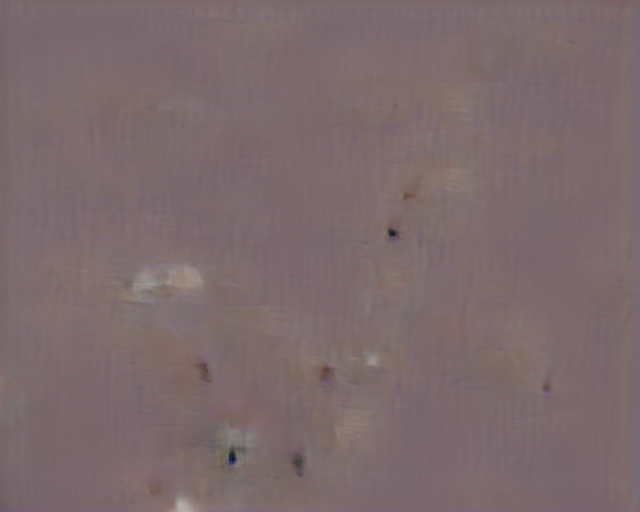

i: 25, loss: 1.10199, losses: 0.25246, 0.849525
averaged:


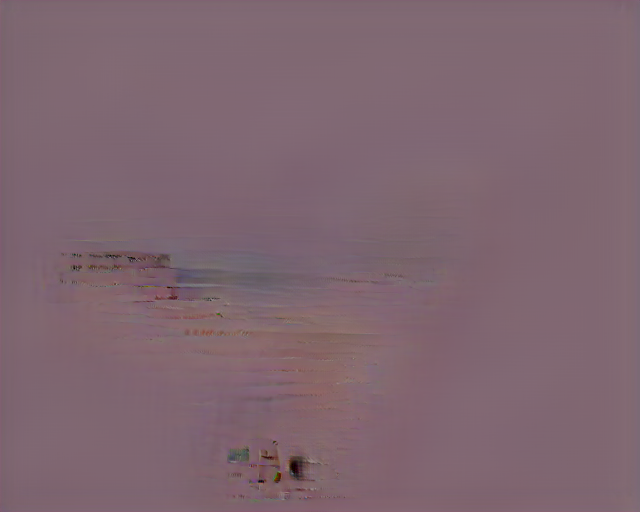

replace z_org
i: 50, loss: 1.05351, losses: 0.221181, 0.832324
averaged:


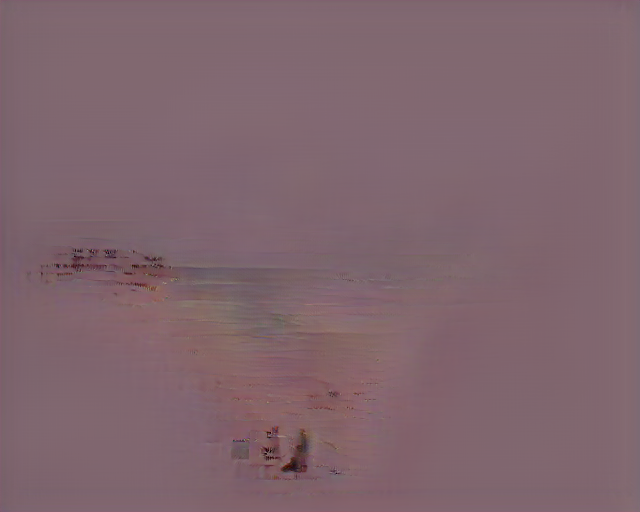

restarting optimization 50 and learning rate 0.45
i: 75, loss: 0.976007, losses: 0.170325, 0.805681
averaged:


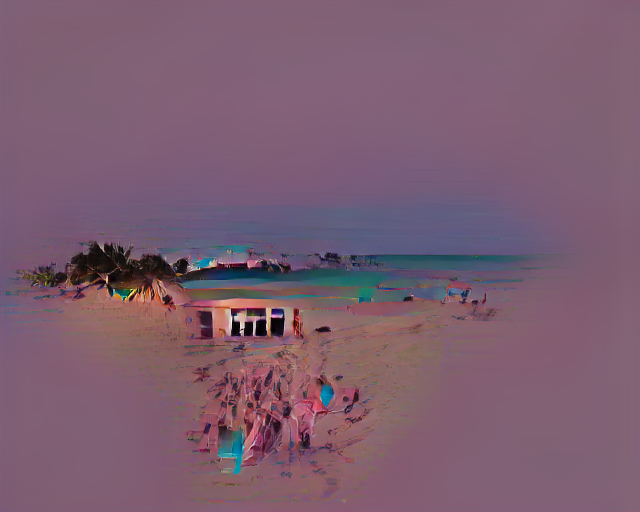

replace z_org
i: 100, loss: 0.988998, losses: 0.187382, 0.801616
averaged:


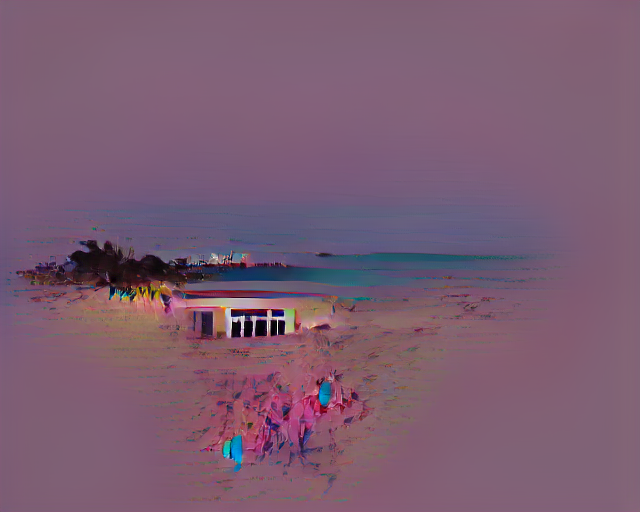

restarting optimization 100 and learning rate 0.45
i: 125, loss: 0.938787, losses: 0.149768, 0.789019
averaged:


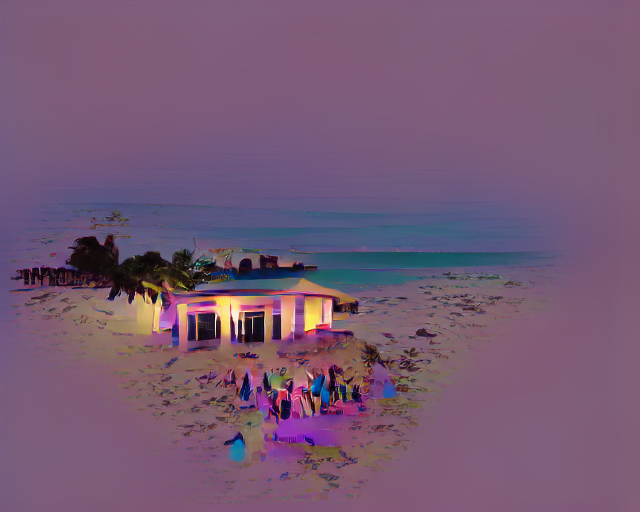

replace z_org
i: 150, loss: 0.930677, losses: 0.123285, 0.807391
averaged:


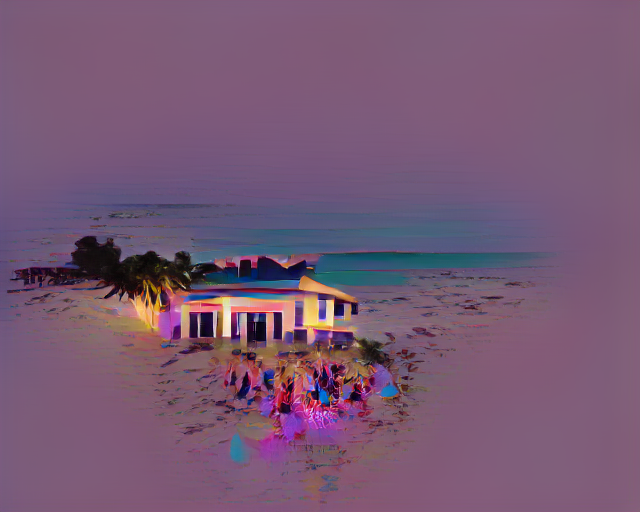

restarting optimization 150 and learning rate 0.45
i: 175, loss: 0.9169, losses: 0.114824, 0.802076
averaged:


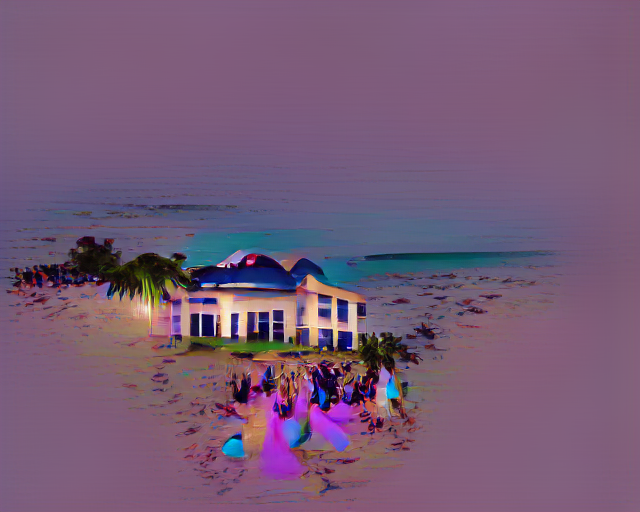

replace z_org
i: 200, loss: 0.880872, losses: 0.0954771, 0.785395
averaged:


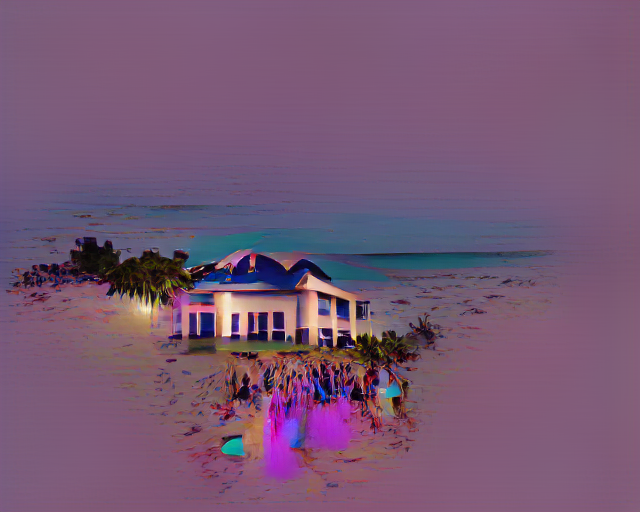

restarting optimization 200 and learning rate 0.45
i: 225, loss: 0.882312, losses: 0.103983, 0.778329
averaged:


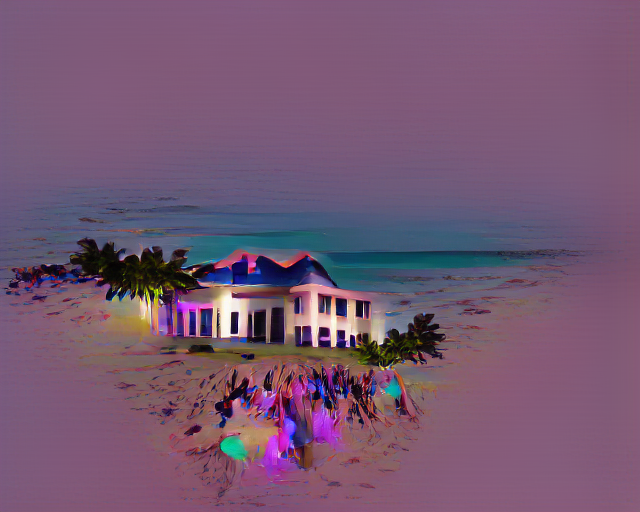

replace z_org
i: 250, loss: 0.862777, losses: 0.0847561, 0.778021
averaged:


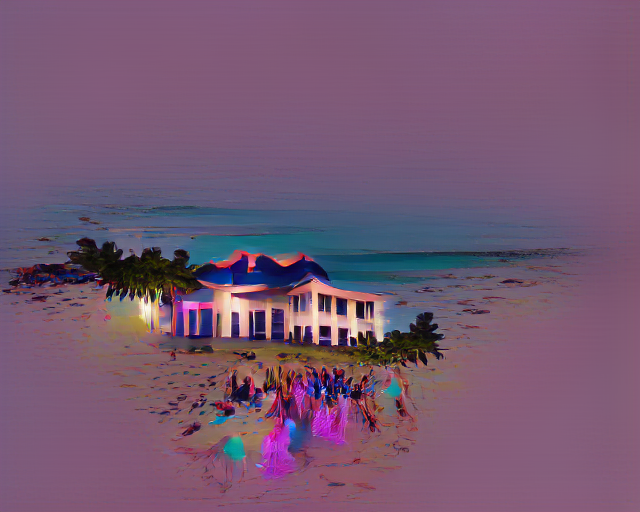

restarting optimization 250 and learning rate 0.45
i: 275, loss: 0.873195, losses: 0.0884883, 0.784707
averaged:


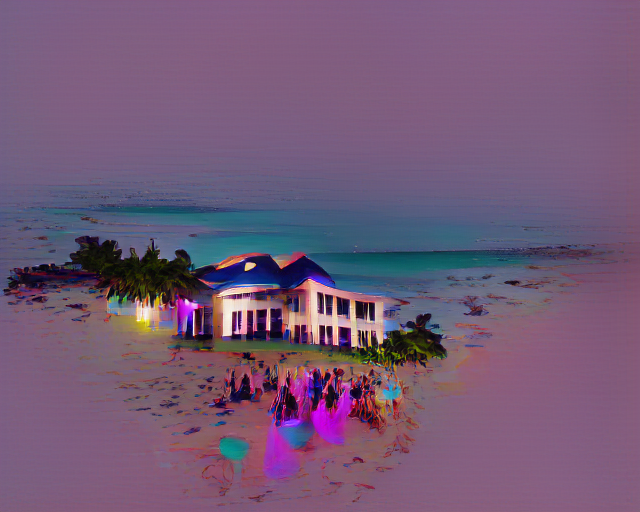

replace z_org
i: 300, loss: 0.845262, losses: 0.0727392, 0.772522
averaged:


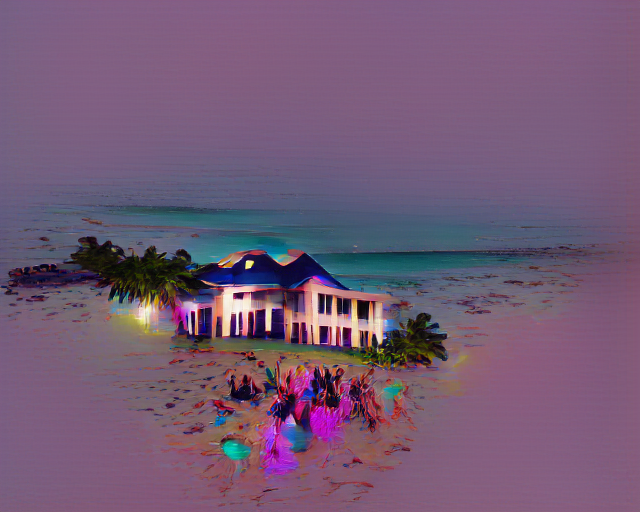

restarting optimization 300 and learning rate 0.45
i: 325, loss: 0.8765, losses: 0.102995, 0.773505
averaged:


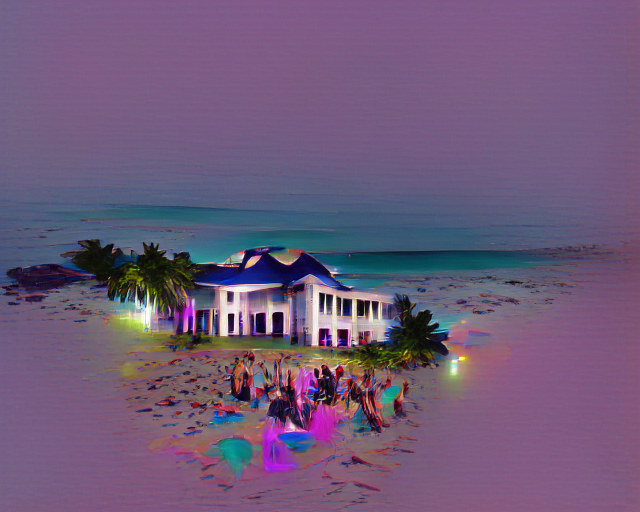

replace z_org
i: 350, loss: 0.840979, losses: 0.0740056, 0.766974
averaged:


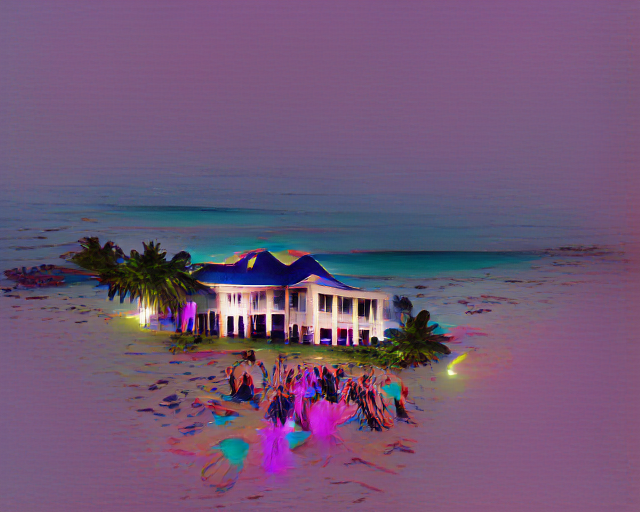

restarting optimization 350 and learning rate 0.45
i: 375, loss: 0.867594, losses: 0.0994794, 0.768115
averaged:


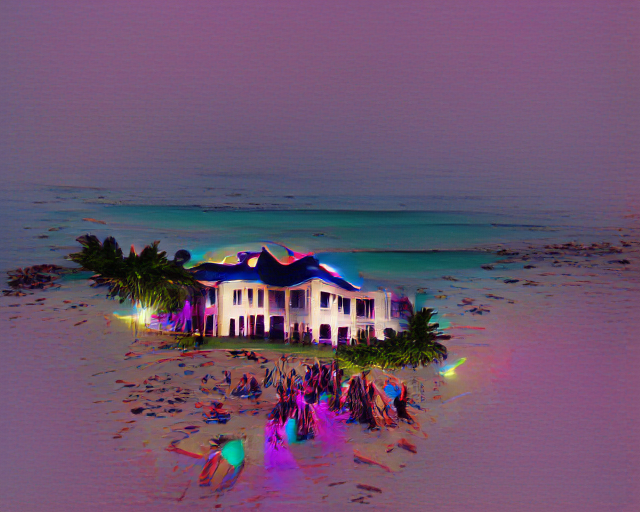

replace z_org
i: 400, loss: 0.829093, losses: 0.0621215, 0.766971
averaged:


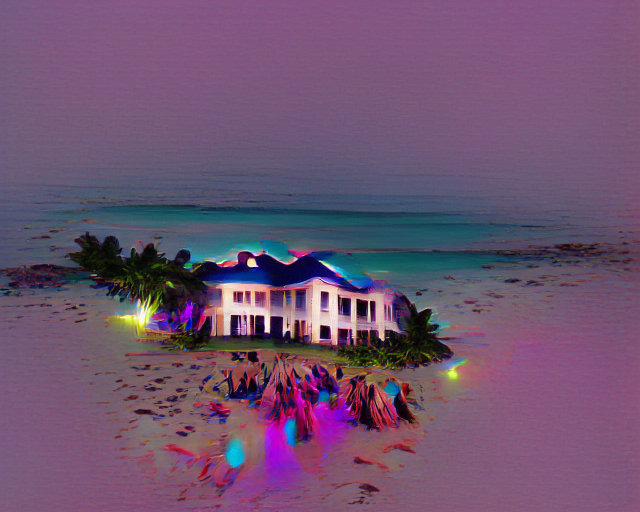

restarting optimization 400 and learning rate 0.45
i: 425, loss: 0.867035, losses: 0.104365, 0.76267
averaged:


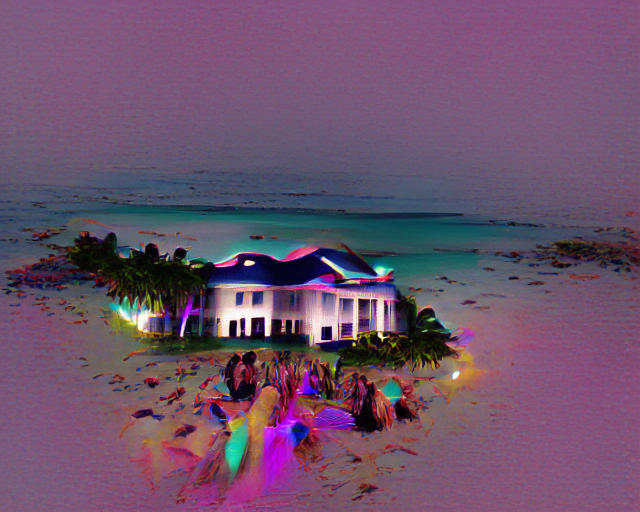

replace z_org
i: 450, loss: 0.809806, losses: 0.0497762, 0.760029
averaged:


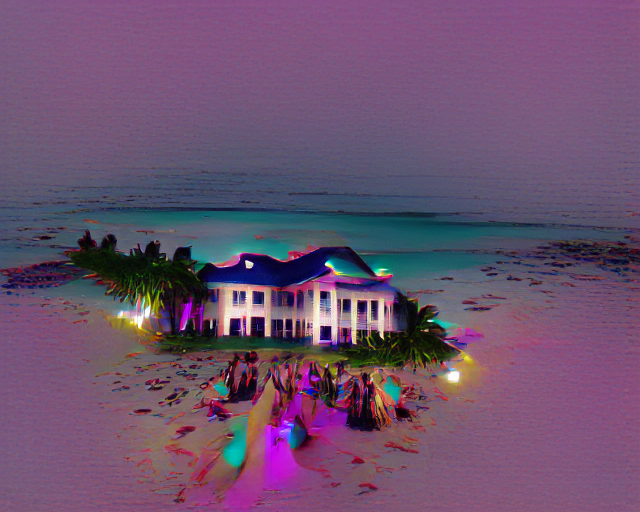

restarting optimization 450 and learning rate 0.45
i: 475, loss: 0.882881, losses: 0.122406, 0.760475
averaged:


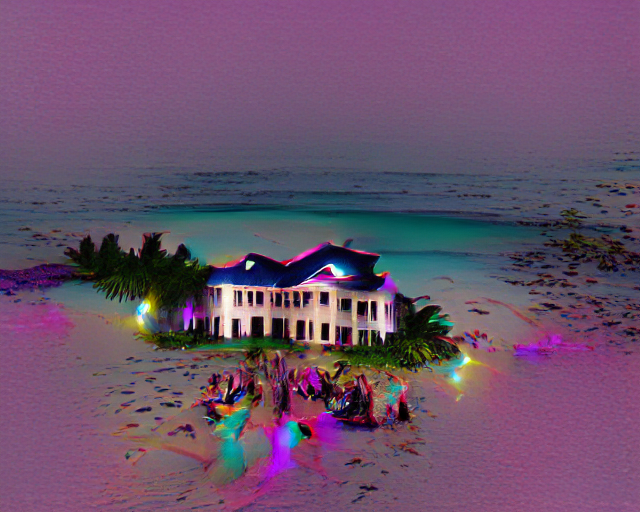

replace z_org
i: 500, loss: 0.764987, losses: 0, 0.764987
averaged:


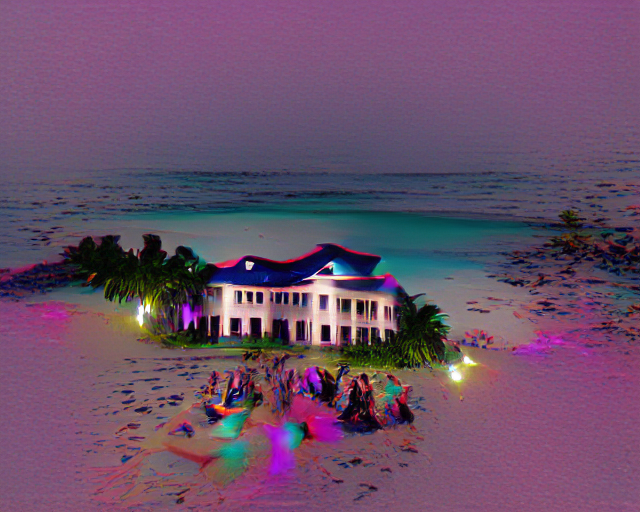

i: 525, loss: 0.762047, losses: 0, 0.762047
averaged:


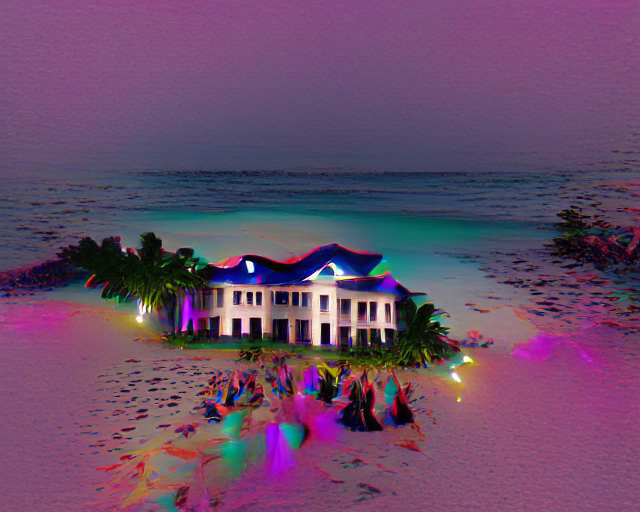

i: 550, loss: 0.753432, losses: 0, 0.753432
averaged:


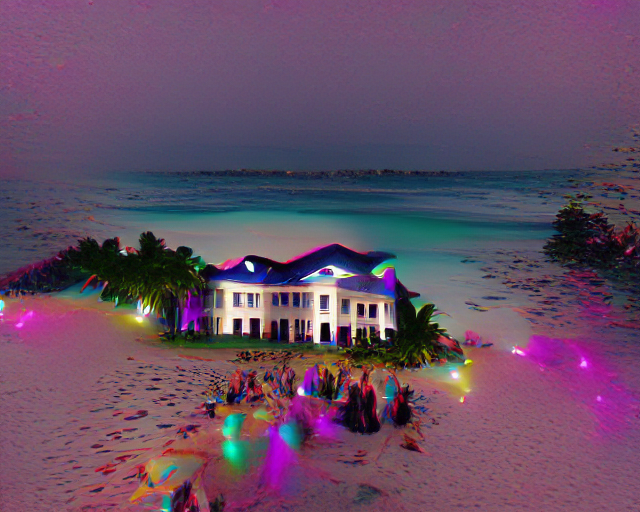

i: 575, loss: 0.75052, losses: 0, 0.75052
averaged:


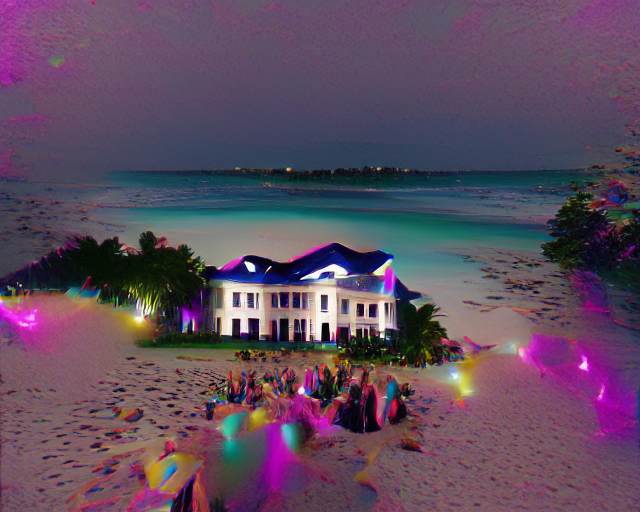

i: 600, loss: 0.744476, losses: 0, 0.744476
averaged:


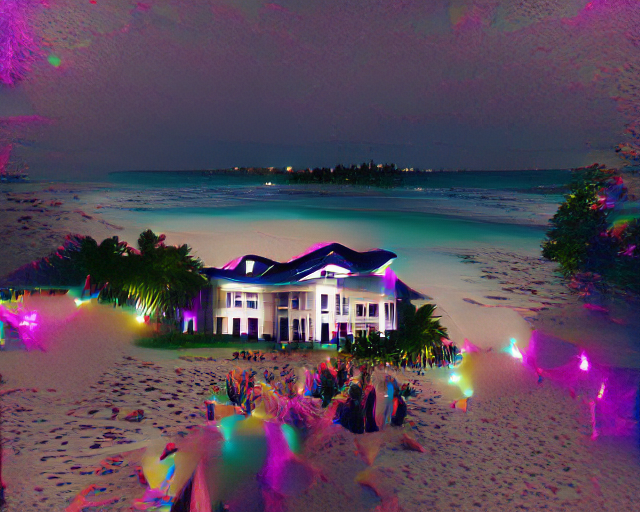

i: 625, loss: 0.743711, losses: 0, 0.743711
averaged:


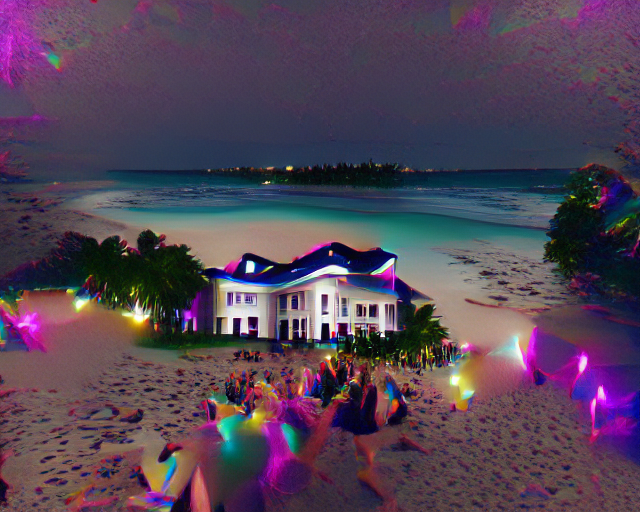

i: 650, loss: 0.737593, losses: 0, 0.737593
averaged:


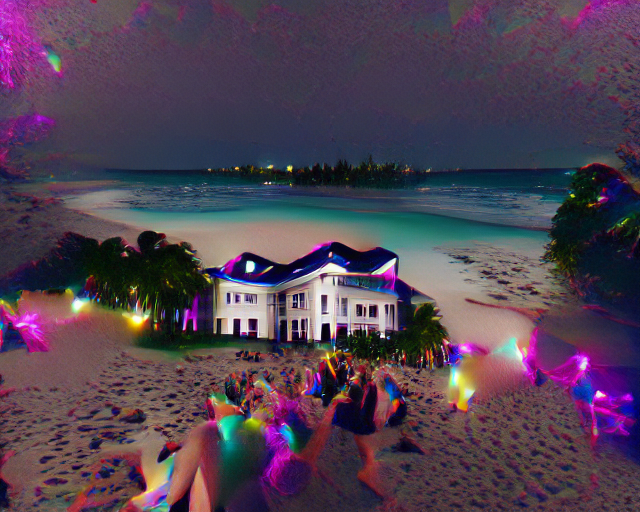

i: 675, loss: 0.737103, losses: 0, 0.737103
averaged:


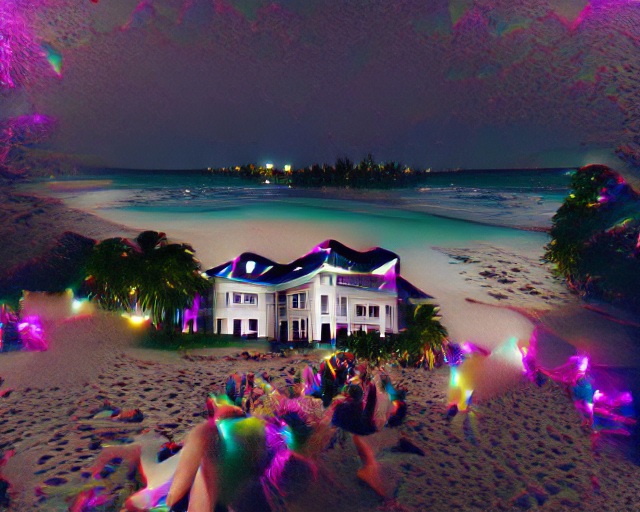

In [12]:
#@markdown # 💭 Do the Run

class Settings(argparse.Namespace):
    
    #@markdown What do you want to see?
    #@markdown
    # @markdown Enter your prompts as an array of strings to help guide VQGAN + CLIP.
    # @markdown - if you want to try using CLIP prior, enable `use_prior`. This will use a diffusion prior to translate your text prompts into image prompts which should result in greater diversity of outputs.
    
    prompts = ["I find myself on a beach, with many beachfront mansions nearby. My friends and I decide we all need to throw a party later that night and so we do."] #@param

        
    use_prior = False # @param {type:"boolean"}
    seed=-1 # @param {type:"integer"}
    
    # @markdown Display dimensions need to be divisible by 16
    width = 640  # @param {type:"number"}
    height = 512 # @param {type:"number"}
    
    # @markdown Do you want to use an init image instead of a randomized start?
    init_image = "" #@param {type:"string"}
    
    # @markdown How frequently do you want to see the outputs?    
    display_freq=25 # @param {type:"integer"}

    #@markdown Are you going to want to make a video after of the full generation?
    
    record_generation=True # @param {type:"boolean"}

    # clip model settings
    clip_model='ViT-B/32'
    vqgan_config='vqgan_imagenet_f16_16384.yaml'     
    vqgan_checkpoint='vqgan_imagenet_f16_16384.ckpt'

    # @markdown ## 🎨 Presets
    #@markdown  Choose a preset to override some of the settings below with premade configurations, or leave as `none` for complete control.
    #@markdown - **high quality** - take it slow and steady, good results by iteration 600
    #@markdown - **fun** - forces the generation to commit to early results. color is more vivid throughout the generation, might work better for some prompts
    #@markdown - **fast** - same as high quality but faster, might be a little messy, full results by iteration 300

    use_preset = "fun" # @param ["high quality", "fun", "fast",  "none"] {allow-input: false}

    #@markdown ## 🎭 Settings
    #@markdown **Note: If you have selected a preset above, it may override some of these settings.**

    use_augs = True
    noise_fac = 0.1
    ema_val = 0.99

    use_noise = None
    constraint_regions = False#

    # add noise to embedding
    noise_prompt_weights = None
    noise_prompt_seeds = [1457]

    # @markdown #### 📉 Learning Rates
    # @markdown The `step_size` is used as the initial learning rate, and at each mse epoch will decay until it reaches the `min_step_size`. Higher step sizes may make the generation less stable, but this is a speed/stability tradeoff.
    step_size=0.95 # @param {type:"number"}
    min_step_size=0.25 # @param {type:"number"}

    # @markdown #### ✂️ Cuts
    # @markdown
    # @markdown Enable `custom_cropping_scheme` to perform more evenly distributed crops across the image (bias decided via `cut_pow`), or uncheck to focus on details near the center of the image (using mostly large and very small crops).
    custom_croping_scheme = False # @param {type:"boolean"}
    cut_pow=1.0 # @param {type:"number"}
    # @markdown Number of cuts to make, you can reduce this to save memory but it may make the generation take longer.
    cutn=64 # @param {type:"integer"}

    # @markdown ### 📑 MSE Schedule
    # @markdown The mse weight determines how strongly the generator pays attention to the mse loss. It starts at `init_weight` and then will decay at each mse epoch until it reaches `min_weight`.
    init_weight = 2.0 # @param {type:"number"}
    min_weight = 0.0 # @param {type:"number"}
    #@markdown lower values fills the rest of the details better, but restricts significant changes after the numbered step
    change_orgin_at = 460 # @param {type:"integer"}
    #@markdown whether or not quantize the refrence image before changing it
    mse_quantize = True # @param {type:"boolean"}
    #@markdown This gives finer control on how the mse weight decays and changes during the generation.
    mse_decay_rate = 50 # @param {type:"integer"}
    mse_epoches = 10 # @param {type:"integer"}
    max_step = 701 # @param {type:"integer"}

    #@markdown Other MSE options:
    mse_withzeros = True # @param {type:"boolean"}
    
    def __init__(self):
        self.size = [self.width,self.height]
        super(Settings,self).__init__( **{k:v for k,v in self.__class__.__dict__.items() if not k.startswith('__') and not callable(v)} )

    # apply another namespace on top of this one
    def apply( self, other ):
        for k,v in vars(other).items():
            setattr( self, k, v )
        if not 'size' in other:
            self.size = [self.width,self.height]

clear_memory()
args = Settings()
if args.use_preset in presets:
    args.apply( presets[args.use_preset] )

# Initialize and Start Generating

# <AUGMENTATIONS>
augs_1 = nn.Sequential(
    K.RandomHorizontalFlip(p=0.5),
    K.RandomAffine(degrees=30, translate=0.1, p=0.8, padding_mode='reflection'), # padding_mode=2
    
    AugmentationSequential(
        MyRandomPerspective(distortion_scale=0.6, p=0.9, padding_mode='zeros'),
        *[MyRandomPerspective(distortion_scale=0.6/i, p=1.0, padding_mode='zeros') for i in range(3,10)],
        random_apply=1,
        random_apply_weights=[0.3]+[0.7/7]*7),

    # MyRandomPerspective(distortion_scale=0.8, p=0.9, padding_mode='zeros'),

    # AugmentationSequential(
    #   K.ColorJitter(hue=0.06, saturation=0.06, p=1.0),
    #   *[K.ColorJitter(hue=i*(0.06/7), saturation=i*(0.06/7), p=1.0) for i in range(0,6)],
    #   random_apply=1,
    #   random_apply_weights=[0.3]+[0.7/7]*6),
    # )
    K.ColorJitter(hue=0.06, saturation=0.06, p=1.0))
    # K.ColorJitter(hue=0.06, saturation=0.01, p=1.0)) # <- use instead of above for better colors for some prompts

mse_decay = 0
if args.init_weight:
  mse_decay = args.init_weight / args.mse_epoches

noise = noise_gen([1, 3, args.size[0], args.size[1]])
image = TF.to_pil_image(noise.div(5).add(0.5).clamp(0, 1)[0])
image.save('init3.png')

# Start the Generation

loss_graph = []
lr_graph = []
weight_graph = []

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print('Using device:', device)
print('using prompts: ', args.prompts)

tv_loss = TVLoss() 

model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
video_frames = []

if args.use_prior:
  print("loaded prior")

perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

mse_weight = args.init_weight

cut_size = perceptor.visual.input_resolution

get_mse_weight = lambda i:  max(mse_weight- (mse_decay* int(i/args.mse_decay_rate)),args.min_weight)
get_mse_lr = lambda i: max(args.step_size- (mse_decay* int(i/args.mse_decay_rate)), args.min_step_size)

if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
    e_dim = 256
    n_toks = model.quantize.n_embed
    z_min = model.quantize.embed.weight.min(dim=0).values[None, :, None, None]
    z_max = model.quantize.embed.weight.max(dim=0).values[None, :, None, None]
else:
    e_dim = model.quantize.e_dim
    n_toks = model.quantize.n_e
    z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
    z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]


make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)

f = 2**(model.decoder.num_resolutions - 1)
toksX, toksY = args.size[0] // f, args.size[1] // f

args.seed = update_random( args.seed, 'generation' )

if args.init_image:
    if 'http' in args.init_image:
        req = Request(args.init_image, headers={'User-Agent': 'Mozilla/5.0'})
        pil_image = Image.open(urlopen(req))
    else:
        pil_image = Image.open(args.init_image).convert('RGB')
    pil_image = pil_image.resize((toksX * 16, toksY * 16), Image.LANCZOS)
    pil_image = TF.to_tensor(pil_image)
    if args.use_noise:
      pil_image = pil_image + args.use_noise * torch.randn_like(pil_image) 
    z, *_ = model.encode(pil_image.to(device).unsqueeze(0) * 2 - 1)

else:
    
    one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()

    if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        z = one_hot @ model.quantize.embed.weight
    else:
        z = one_hot @ model.quantize.embedding.weight
    z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2)

z = EMATensor(z, args.ema_val)


if args.mse_withzeros and not args.init_image:
  z_orig = torch.zeros_like(z.tensor)
else:
  z_orig = z.tensor.clone()

out_sum = torch.zeros([1, 3, 512, 640]).to(device)
z_temp = torch.zeros_like(z.tensor)

opt = adamp(z.parameters(), lr=args.step_size, betas=(0.99, 0.999))

normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                 std=[0.26862954, 0.26130258, 0.27577711])

pMs = []


for prompt in args.prompts:
    txt, weight, stop = parse_prompt(prompt)

    if args.use_prior:
            
      # todo add to args
      best_of_n = 2

      #
      clip_prior_ckpt = 'clip_prior_6_6370000.pth'
      clip_prior = CLIPDiffusionPrior(perceptor.visual.output_dim, 512, 768, 12)
      clip_prior.load_state_dict(torch.load(clip_prior_ckpt, map_location='cpu')['model_ema'])
      clip_prior = clip_prior.to(device).eval().requires_grad_(False)

      text_toks = clip.tokenize(prompt, truncate=True).to(device)
      text_embed = perceptor.encode_text(text_toks).float()
      text_feats = encode_text_with_feats(perceptor, text_toks).float().repeat([best_of_n, 1, 1])
      text_padding = make_padding_mask(text_toks).repeat([best_of_n, 1])
      unsafe = torch.full([best_of_n], 0, device=device)
      null_feats = encode_text_with_feats(perceptor, clip_prior.null_text).float()
      null_padding = make_padding_mask(clip_prior.null_text)
      null_unsafe = unsafe[:1]
      #
      noise = torch.randn([best_of_n, text_embed.shape[1]], device=device)
      t = torch.linspace(1, 0, 1000 + 1)[:-1]
      steps = diff_utils.get_spliced_ddpm_cosine_schedule(t)
      extra_args = {'feats': text_feats, 'feats_padding_mask': text_padding, 'unsafe': unsafe}
      target_embeds = sampling.sample(pred_to_v(clip_prior), noise, steps, 1., extra_args)
      target_embeds = target_embeds.view([best_of_n, 1, -1])
      best_embeds = torch.cosine_similarity(target_embeds, text_embed, dim=-1).argmax(0)
      target_embed = target_embeds[best_embeds, torch.arange(1, device=device)]
      pMs.append(Prompt(target_embed))
    else:
      embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
      pMs.append(Prompt(embed, weight, stop).to(device))

def synth(z, quantize=True):
    # if args.constraint_regions:
    #   z = replace_grad(z, z * z_mask)

    if quantize:
      if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        z_q = vector_quantize(z.movedim(1, 3), model.quantize.embed.weight).movedim(3, 1)
      else:
        z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)

    else:
      z_q = z

    return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)
    # return clamp_with_grad(vqgan_dec_skip_lores_attn(model, z_q).add(1).div(2), 0, 1)

@torch.no_grad()
def checkin(i, losses):
    losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
    tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')

    print("averaged:")

    out = synth(z.average, True)
    TF.to_pil_image(out[0].cpu()).save('progress2.png')   
    display.display(display.Image('progress2.png'))

    



def ascend_txt():
    global mse_weight
    global z_orig
    global z_temp
    global out_sum
    out = synth(z.tensor)

    if args.record_generation:
      with torch.no_grad():
        global vid_index

        out_ = synth(z.average)
        video_frames.append(out_[0].detach().cpu())

        vid_index += 1

    result = []
    cutouts = make_cutouts(out)

    if args.use_augs:
        cutouts = augs_1(cutouts)
        
    if args.noise_fac:
      facs = cutouts.new_empty([args.cutn, 1, 1, 1]).uniform_(0, args.noise_fac)
      cutouts = cutouts + facs * torch.randn_like(cutouts)

    iii = perceptor.encode_image(normalize(cutouts)).float()

    

    if args.init_weight:
        
        global z_orig
        mse_weight_ = get_mse_weight(i)
        result.append(F.mse_loss(z.tensor, z_orig) * (mse_weight_ / 2))
        weight_graph.append(mse_weight_)

        with torch.no_grad():
          if i > 0 and i%args.mse_decay_rate==0 and i <= args.mse_decay_rate*args.mse_epoches and i > args.change_orgin_at - 2:   
            if args.mse_quantize:
              z_orig = vector_quantize(z.tensor.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)#z.average
            else:
              z_orig = z.tensor.clone()    
            print("replace z_org") 


    for prompt in pMs:
        result.append(prompt(iii))

    return result

vid_index = 0
def train(i):
    
    opt.zero_grad()
    lossAll = ascend_txt()

    if i % args.display_freq == 0:
        checkin(i, lossAll)
    
    loss = sum(lossAll)
    loss_graph.append([atensor.detach().cpu() for atensor in lossAll])

    loss.backward()

    opt.step()
    z.update()

    lr_graph.append(get_current_lr(opt,0,0))

i = 0
try:
    with tqdm() as pbar:
        while True and i < args.max_step:         

            train(i)

            if i > 0 and i%args.mse_decay_rate==0 and i < args.mse_decay_rate*args.mse_epoches -1:# and mse_weight:
              z = EMATensor(z.tensor, args.ema_val)

              if i > args.change_orgin_at - 2:
                opt = adamp(z.parameters(), lr=args.min_step_size, weight_decay=0.0, betas=(0.99, 0.999))
              else:
                opt = adamp(z.parameters(), lr=get_mse_lr(i), weight_decay=0.0, betas=(0.99, 0.999))
              
              print(f"restarting optimization {i} and learning rate {get_mse_lr(i)}")

            i += 1
            pbar.update()

except KeyboardInterrupt:
    pass




# 👁️‍🗨️ Inspect Losses

0.49013056167154767

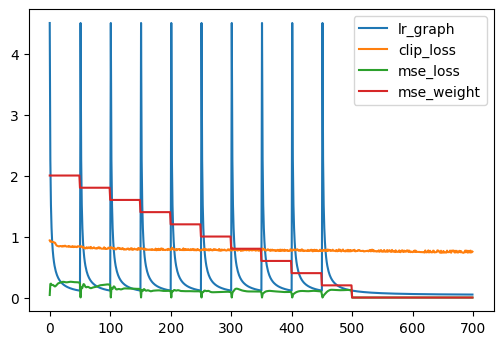

In [13]:
#@markdown ##  📉 Show Graph
#@markdown This graph will show the learning rate, clip loss, and mse weight during the generation.
import matplotlib.pyplot as plt
plt.figure(dpi=100)
plt.plot([num*0.1 for num in lr_graph][:], label="lr_graph")
plt.plot([num[1] for num in loss_graph][:], label="clip_loss")
plt.plot([num[0] for num in loss_graph][:], label="mse_loss")
plt.plot(weight_graph, label="mse_weight")
plt.legend()

get_mse_weight(10000)
lr_graph[-1]

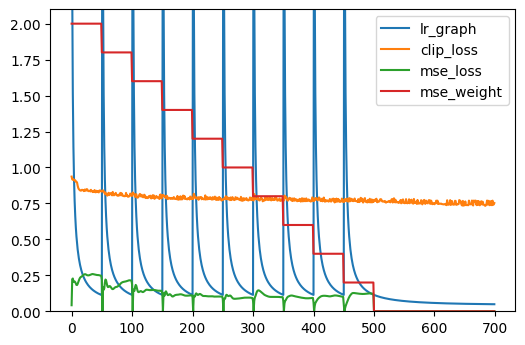

In [14]:
# @markdown ##  🔍📉 Zoomed In Graph
#@markdown This graph will show the learning rate, clip loss, and mse weight during the generation.
plt.figure(dpi=100)
plt.ylim(0, 2.1)
plt.plot([num*0.1 for num in lr_graph][:], label="lr_graph")
plt.plot([num[1] for num in loss_graph][:], label="clip_loss")
plt.plot([num[0] for num in loss_graph][:], label="mse_loss")
plt.plot(weight_graph, label="mse_weight")
plt.legend()


# 📼 Render Video
Make a video of your generation. For this to work, `record_generation` must be enabled.

In [15]:
# @title 🎞 Save Video Frames to Disk
if args.record_generation:
  for vid_index, out_ in enumerate(tqdm(video_frames)):
    TF.to_pil_image(out_).save(f'/content/vids/{vid_index}.png')

  0%|          | 0/700 [00:00<?, ?it/s]

In [16]:
# @title 🎬 Render and Download

images = "%d.png"
video = "/content/movie1024.mp4"# @param {type:"string"}
framerate = 24 # @param {type:"integer"}
sizexy = "640x512" # @param {type:"string"}

if args.record_generation:
  %cd vids

  # !ffmpeg -r $framerate -i $images -crf 20 -s 640x512 -pix_fmt yuv420p $video
  !ffmpeg -r $framerate -i $images -crf 20 -s $sizexy -pix_fmt yuv420p $video

  %cd ..

  from google.colab import files
  files.download(video.split("/")[-1]) 

/content/vids
ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxv

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [17]:
#@title 📺🧨💥 Delete All Frames from Folder
delete_images = False# @param{type:"boolean"}

if delete_images:
  %cd vids
  %rm *.png
  %cd ..